In [1]:
from get_file_matches import get_tif_file_matches
from load_train_eval import load_data, train_and_evaluate, visualize_prediction, evaluate_predictions

from tensorflow.keras import layers, models
from sklearn.model_selection import train_test_split
import numpy as np

In [2]:
def build_hrnet_with_attention_unet(input_shape):
    inputs = layers.Input(input_shape)

    # Encoder with Squeeze-and-Excitation (SE) blocks
    c1 = layers.Conv2D(64, (3, 3), activation="relu", padding="same")(inputs)
    c1 = layers.Conv2D(64, (3, 3), activation="relu", padding="same")(c1)
    c1 = squeeze_excitation_block(c1)
    p1 = layers.MaxPooling2D((2, 2))(c1)

    c2 = layers.Conv2D(128, (3, 3), activation="relu", padding="same")(p1)
    c2 = layers.Conv2D(128, (3, 3), activation="relu", padding="same")(c2)
    c2 = squeeze_excitation_block(c2)
    p2 = layers.MaxPooling2D((2, 2))(c2)

    c3 = layers.Conv2D(256, (3, 3), activation="relu", padding="same")(p2)
    c3 = layers.Conv2D(256, (3, 3), activation="relu", padding="same")(c3)
    c3 = squeeze_excitation_block(c3)
    p3 = layers.MaxPooling2D((2, 2))(c3)

    # Bottleneck
    c4 = layers.Conv2D(512, (3, 3), activation="relu", padding="same")(p3)
    c4 = layers.Conv2D(512, (3, 3), activation="relu", padding="same")(c4)
    c4 = squeeze_excitation_block(c4)

    # Decoder
    u3 = layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding="same")(c4)
    u3 = layers.Concatenate()([u3, c3])
    c5 = layers.Conv2D(256, (3, 3), activation="relu", padding="same")(u3)
    c5 = layers.Conv2D(256, (3, 3), activation="relu", padding="same")(c5)
    c5 = squeeze_excitation_block(c5)

    u2 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding="same")(c5)
    u2 = layers.Concatenate()([u2, c2])
    c6 = layers.Conv2D(128, (3, 3), activation="relu", padding="same")(u2)
    c6 = layers.Conv2D(128, (3, 3), activation="relu", padding="same")(c6)
    c6 = squeeze_excitation_block(c6)

    u1 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding="same")(c6)
    u1 = layers.Concatenate()([u1, c1])
    c7 = layers.Conv2D(64, (3, 3), activation="relu", padding="same")(u1)
    c7 = layers.Conv2D(64, (3, 3), activation="relu", padding="same")(c7)
    c7 = squeeze_excitation_block(c7)

    # Final Output
    outputs = layers.Conv2D(1, (1, 1), activation="sigmoid")(c7)

    return models.Model(inputs, outputs)


# Squeeze-and-Excitation Block
def squeeze_excitation_block(input_tensor, ratio=16):
    channel_axis = -1
    filters = input_tensor.shape[channel_axis]
    se = layers.GlobalAveragePooling2D()(input_tensor)
    se = layers.Reshape((1, 1, filters))(se)
    se = layers.Dense(filters // ratio, activation="relu", use_bias=False)(se)
    se = layers.Dense(filters, activation="sigmoid", use_bias=False)(se)
    return layers.Multiply()([input_tensor, se])


In [3]:
root_dir = "data/Tschernitz"
folder1 = "output"
folder2 = "ground_truth_masks/forest_masks"

# Match stacked TIF and ground truth mask
matches = get_tif_file_matches(root_dir, folder1, folder2, contains1="final_input", contains2="merged")

# Load Data and Train
X, Y = load_data(matches)

# Normalize inputs and binarize ground truth masks
X = X / 255.0
Y = (Y > 0).astype(np.float32)

Folder1 Path: data/Tschernitz\output
Folder2 Path: data/Tschernitz\ground_truth_masks/forest_masks


In [4]:
X_train, X_val, Y_train, Y_val = train_test_split(X, Y, test_size=0.2, random_state=42)

Epoch 1/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 18s 5s/step - accuracy: 0.5750 - loss: 0.6945 - val_accuracy: 0.6190 - val_loss: 0.6903
Epoch 2/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 9s 5s/step - accuracy: 0.5830 - loss: 0.6923 - val_accuracy: 0.6848 - val_loss: 0.6899
Epoch 3/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 10s 6s/step - accuracy: 0.6469 - loss: 0.6905 - val_accuracy: 0.6687 - val_loss: 0.6856
Epoch 4/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 17s 10s/step - accuracy: 0.6105 - loss: 0.6864 - val_accuracy: 0.6208 - val_loss: 0.6776
Epoch 5/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 17s 9s/step - accuracy: 0.5851 - loss: 0.6802 - val_accuracy: 0.6832 - val_loss: 0.6622
Epoch 6/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 17s 9s/step - accuracy: 0.6506 - loss: 0.6723 - val_accuracy: 0.7466 - val_loss: 0.6423
Epoch 7/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 19s 11s/step - accuracy: 0.6973 - loss: 0.6462 - val_accuracy: 0.7210 - val_loss: 0.6037
Epoch 8/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 23s 13s/step - accuracy: 0.7025 - loss: 0.6062 - val_accuracy: 0.7795 - val_loss: 0.5422
Epoch 

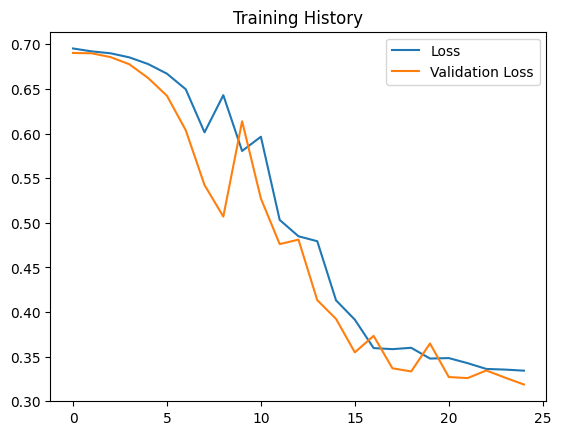

Evaluating model...
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


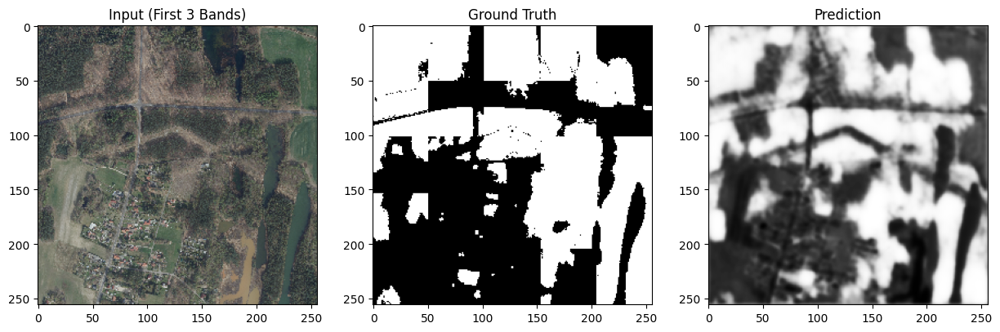

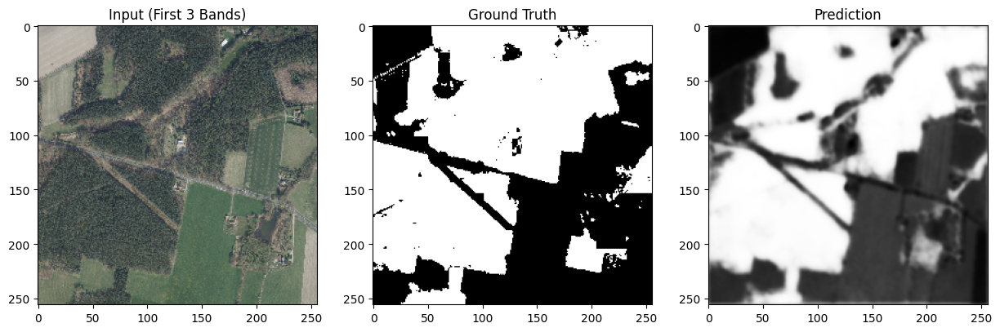

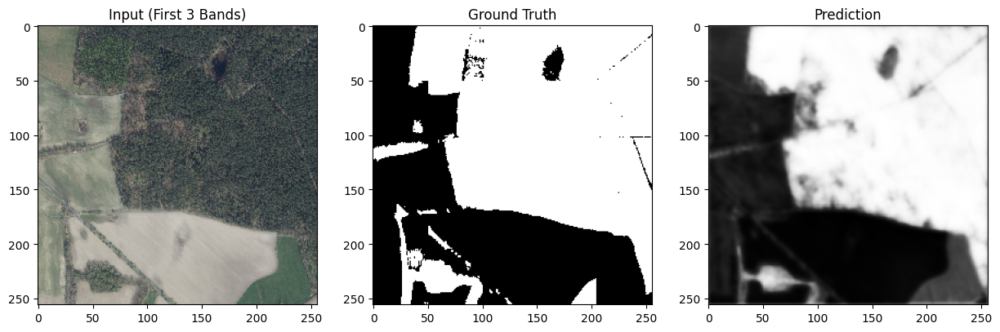

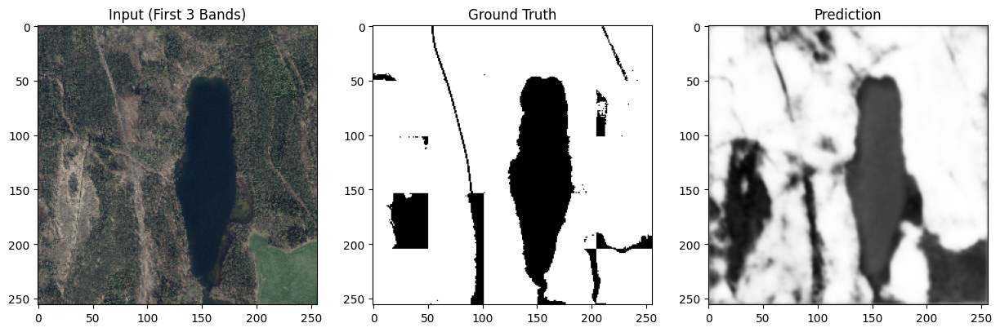

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step

==== Model Evaluation Metrics ====
IoU: 0.7966
Dice: 0.8837
Accuracy: 0.8664
Precision: 0.9154
Recall: 0.8548


In [5]:
# Re-train HRNet with the adjusted architecture
hrnet_results_full = train_and_evaluate(X_train, Y_train, X_val, Y_val, build_hrnet_with_attention_unet, batch_size=8, epochs=25)

Epoch 1/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 57s 7s/step - accuracy: 0.6546 - loss: 0.6946 - val_accuracy: 0.6190 - val_loss: 0.6885
Epoch 2/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 24s 6s/step - accuracy: 0.5818 - loss: 0.6909 - val_accuracy: 0.6190 - val_loss: 0.6879
Epoch 3/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 23s 6s/step - accuracy: 0.5987 - loss: 0.6892 - val_accuracy: 0.6190 - val_loss: 0.6838
Epoch 4/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 23s 6s/step - accuracy: 0.5964 - loss: 0.6836 - val_accuracy: 0.6190 - val_loss: 0.6695
Epoch 5/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 25s 6s/step - accuracy: 0.5361 - loss: 0.6823 - val_accuracy: 0.6733 - val_loss: 0.6459
Epoch 6/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 22s 6s/step - accuracy: 0.6090 - loss: 0.6463 - val_accuracy: 0.7344 - val_loss: 0.5662
Epoch 7/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 42s 6s/step - accuracy: 0.6678 - loss: 0.6678 - val_accuracy: 0.7857 - val_loss: 0.6011
Epoch 8/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 24s 6s/step - accuracy: 0.7856 - loss: 0.5662 - val_accuracy: 0.7065 - val_loss: 0.5739
Epoch 9/

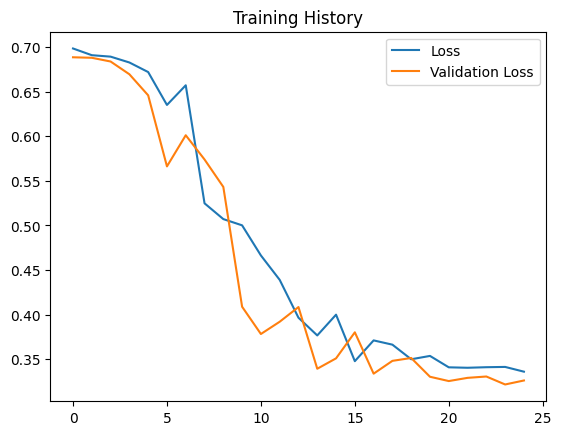

Evaluating model...
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


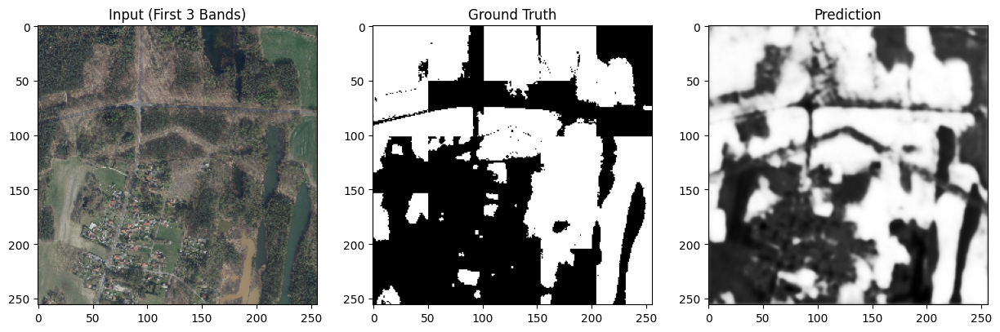

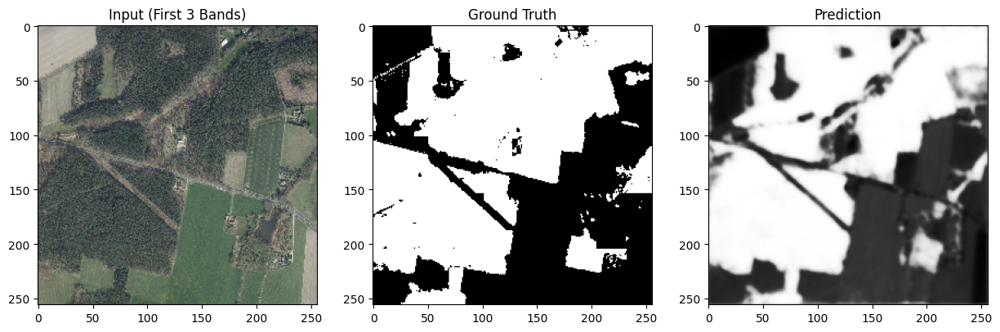

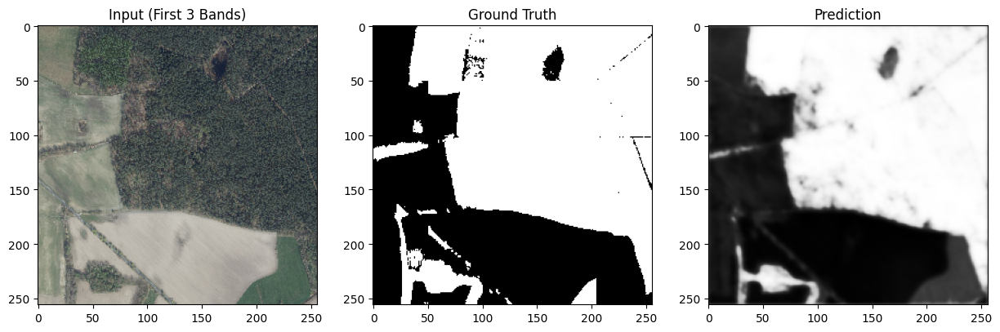

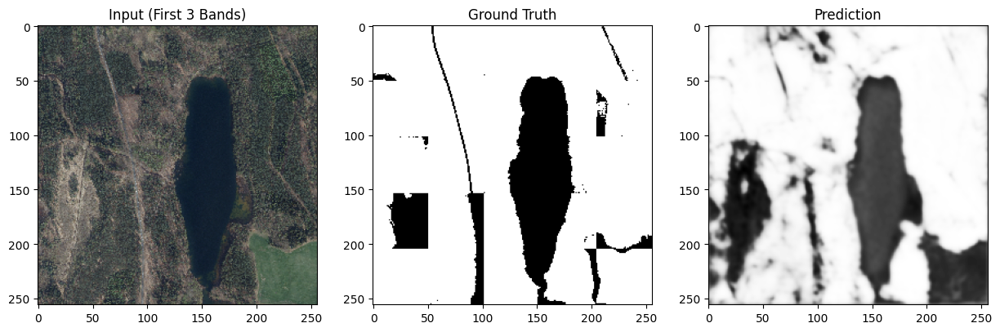

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step

==== Model Evaluation Metrics ====
IoU: 0.8080
Dice: 0.8901
Accuracy: 0.8693
Precision: 0.8960
Recall: 0.8865


In [6]:
# Re-train HRNet with the adjusted architecture
hrnet_results_full = train_and_evaluate(X_train, Y_train, X_val, Y_val, build_hrnet_with_attention_unet, batch_size=4, epochs=25, learning_rate=1e-3)


Applying Augmentation Configuration 1/4: {'RandomRotate90': 0.5, 'HorizontalFlip': 0.5}
Epoch 1/25
8/8 ━━━━━━━━━━━━━━━━━━━━ 92s 8s/step - accuracy: 0.4771 - loss: 0.6933 - val_accuracy: 0.6190 - val_loss: 0.6804
Epoch 2/25
8/8 ━━━━━━━━━━━━━━━━━━━━ 64s 8s/step - accuracy: 0.5804 - loss: 0.6810 - val_accuracy: 0.7250 - val_loss: 0.6123
Epoch 3/25
8/8 ━━━━━━━━━━━━━━━━━━━━ 64s 8s/step - accuracy: 0.7575 - loss: 0.5652 - val_accuracy: 0.7997 - val_loss: 0.4236
Epoch 4/25
8/8 ━━━━━━━━━━━━━━━━━━━━ 65s 8s/step - accuracy: 0.8121 - loss: 0.4330 - val_accuracy: 0.8195 - val_loss: 0.3601
Epoch 5/25
8/8 ━━━━━━━━━━━━━━━━━━━━ 66s 8s/step - accuracy: 0.8481 - loss: 0.3658 - val_accuracy: 0.8405 - val_loss: 0.3603
Epoch 6/25
8/8 ━━━━━━━━━━━━━━━━━━━━ 64s 8s/step - accuracy: 0.8426 - loss: 0.3723 - val_accuracy: 0.7464 - val_loss: 0.4871
Epoch 7/25
8/8 ━━━━━━━━━━━━━━━━━━━━ 62s 8s/step - accuracy: 0.8139 - loss: 0.4408 - val_accuracy: 0.8417 - val_loss: 0.3476
Epoch 8/25
8/8 ━━━━━━━━━━━━━━━━━━━━ 63s 8s/

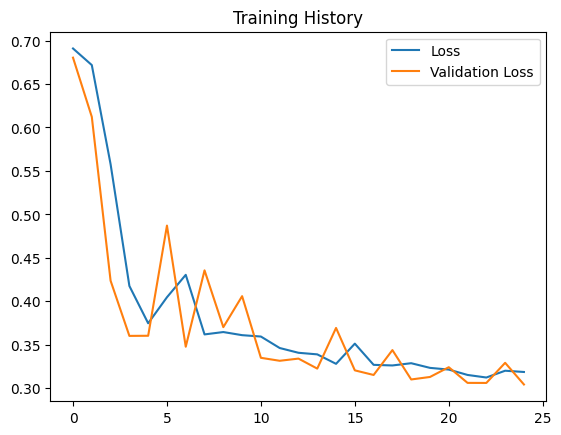

Evaluating model...
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


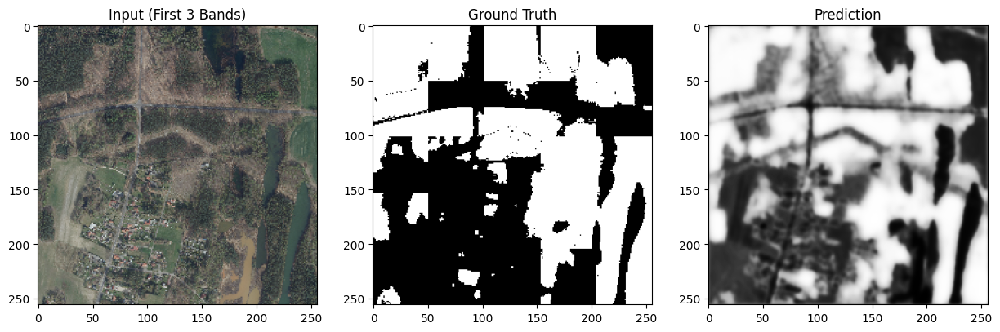

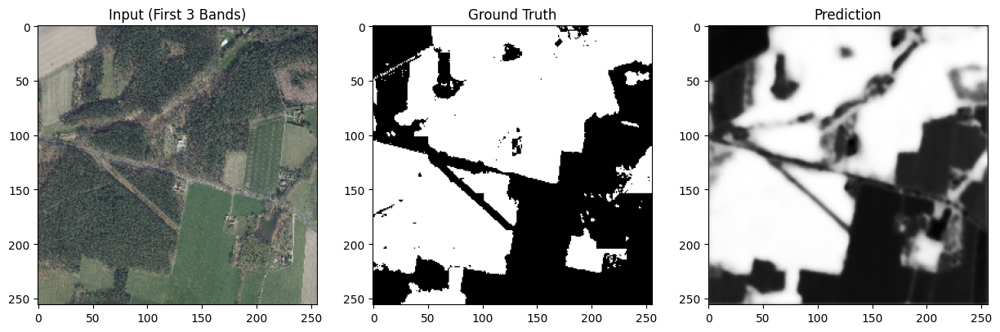

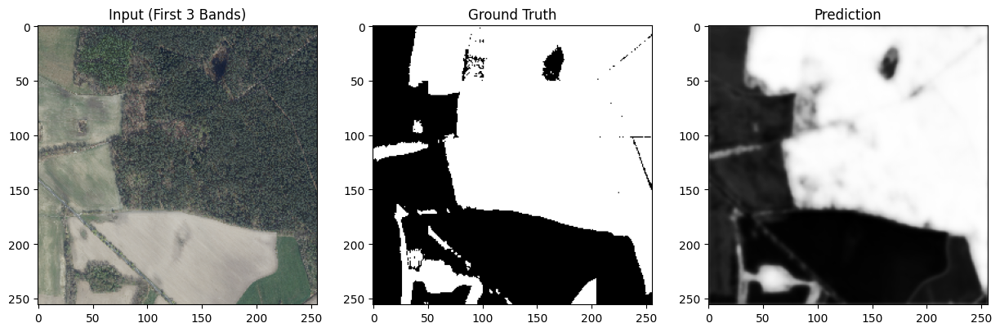

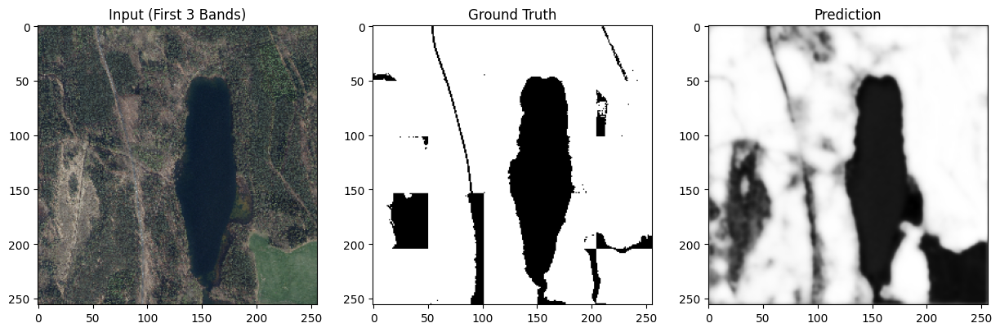

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step

==== Model Evaluation Metrics ====
IoU: 0.8149
Dice: 0.8945
Accuracy: 0.8761
Precision: 0.9045
Recall: 0.8866

Applying Augmentation Configuration 2/4: {'ShiftScaleRotate': {'shift_limit': 0.01, 'scale_limit': 0.05, 'rotate_limit': 15, 'p': 0.5}}
Epoch 1/25
8/8 ━━━━━━━━━━━━━━━━━━━━ 57s 4s/step - accuracy: 0.4496 - loss: 0.6947 - val_accuracy: 0.6190 - val_loss: 0.6810
Epoch 2/25
8/8 ━━━━━━━━━━━━━━━━━━━━ 27s 3s/step - accuracy: 0.5397 - loss: 0.6898 - val_accuracy: 0.6387 - val_loss: 0.6789
Epoch 3/25
8/8 ━━━━━━━━━━━━━━━━━━━━ 32s 4s/step - accuracy: 0.6427 - loss: 0.6732 - val_accuracy: 0.6728 - val_loss: 0.6304
Epoch 4/25
8/8 ━━━━━━━━━━━━━━━━━━━━ 31s 4s/step - accuracy: 0.7597 - loss: 0.6113 - val_accuracy: 0.7969 - val_loss: 0.5079
Epoch 5/25
8/8 ━━━━━━━━━━━━━━━━━━━━ 34s 4s/step - accuracy: 0.7659 - loss: 0.5290 - val_accuracy: 0.8083 - val_loss: 0.4389
Epoch 6/25
8/8 ━━━━━━━━━━━━━━━━━━━━ 30s 4s/step - accuracy: 0.8021 - loss: 0.4550 - val_accuracy

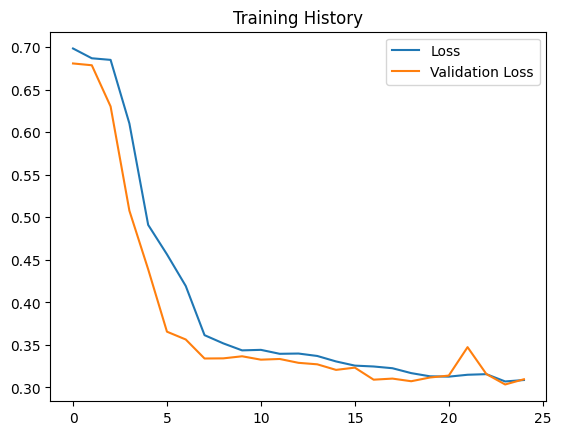

Evaluating model...
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


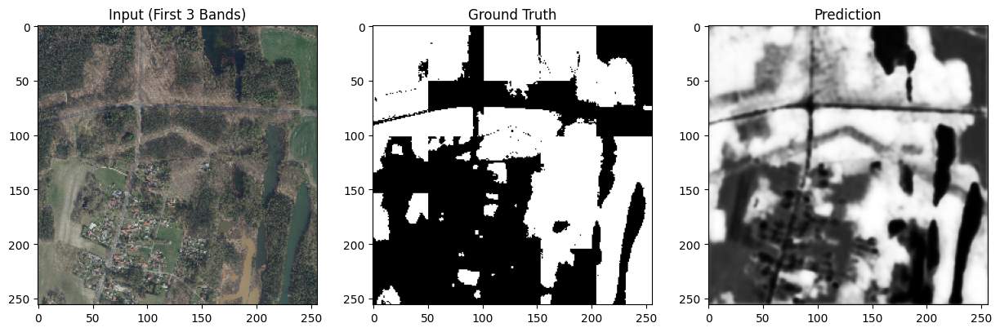

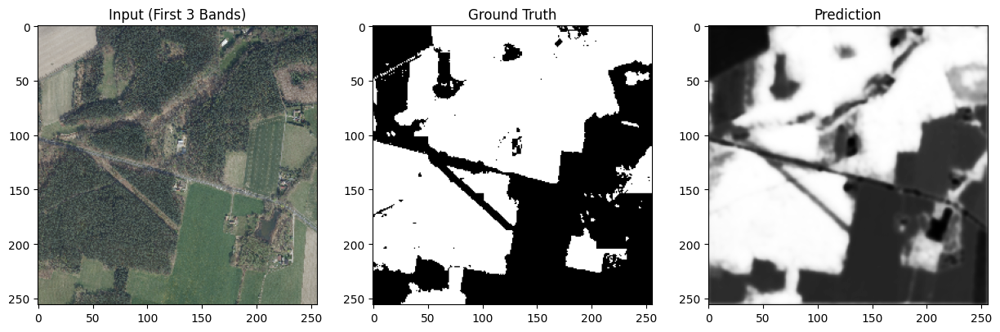

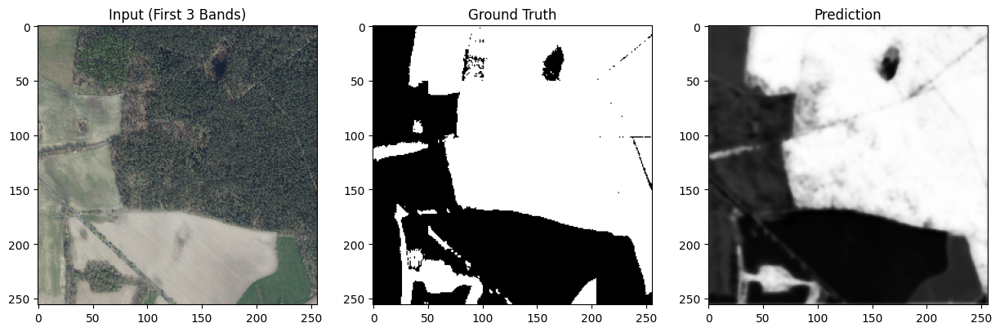

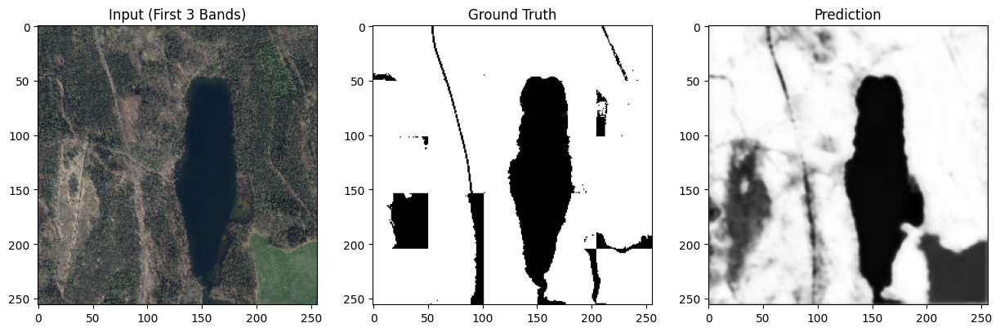

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step

==== Model Evaluation Metrics ====
IoU: 0.8108
Dice: 0.8917
Accuracy: 0.8739
Precision: 0.9052
Recall: 0.8798

Applying Augmentation Configuration 3/4: {'RandomBrightnessContrast': {'brightness_limit': 0.1, 'contrast_limit': 0.1, 'p': 0.5}}
Epoch 1/25
8/8 ━━━━━━━━━━━━━━━━━━━━ 60s 4s/step - accuracy: 0.5039 - loss: 0.6927 - val_accuracy: 0.7527 - val_loss: 0.6863
Epoch 2/25
8/8 ━━━━━━━━━━━━━━━━━━━━ 31s 4s/step - accuracy: 0.7211 - loss: 0.6847 - val_accuracy: 0.6200 - val_loss: 0.6607
Epoch 3/25
8/8 ━━━━━━━━━━━━━━━━━━━━ 30s 4s/step - accuracy: 0.5835 - loss: 0.6706 - val_accuracy: 0.7610 - val_loss: 0.5615
Epoch 4/25
8/8 ━━━━━━━━━━━━━━━━━━━━ 33s 4s/step - accuracy: 0.7582 - loss: 0.5404 - val_accuracy: 0.7227 - val_loss: 0.4997
Epoch 5/25
8/8 ━━━━━━━━━━━━━━━━━━━━ 32s 4s/step - accuracy: 0.7231 - loss: 0.6082 - val_accuracy: 0.7926 - val_loss: 0.4259
Epoch 6/25
8/8 ━━━━━━━━━━━━━━━━━━━━ 31s 4s/step - accuracy: 0.7692 - loss: 0.4925 - val_accuracy: 0.76

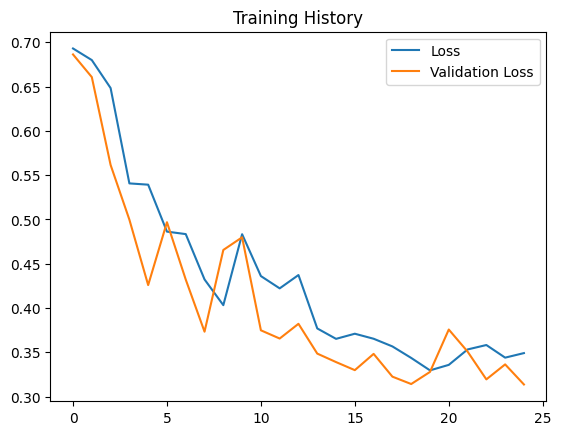

Evaluating model...
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


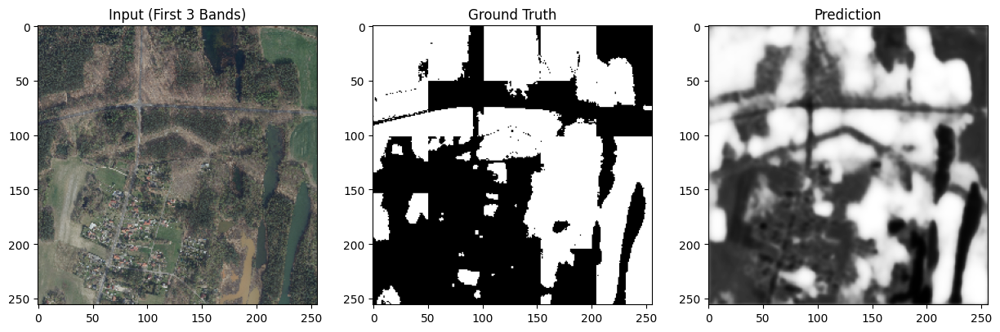

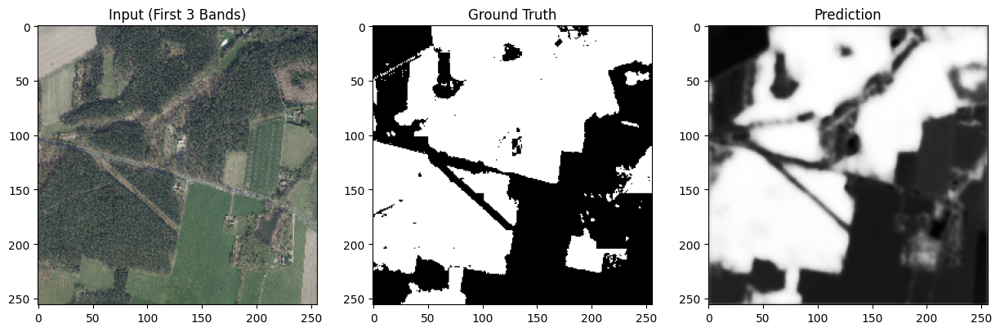

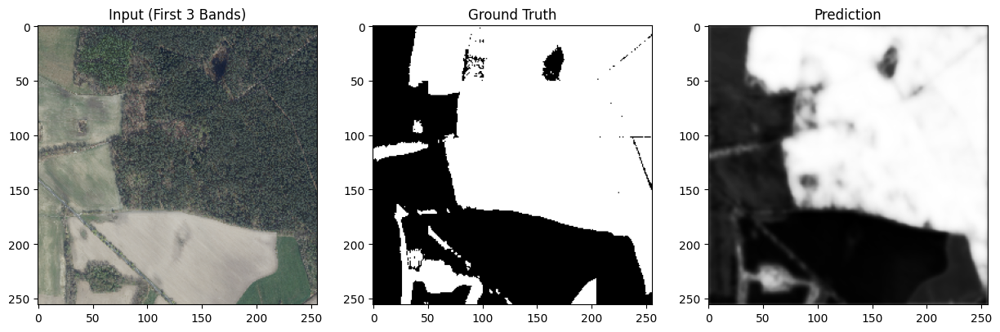

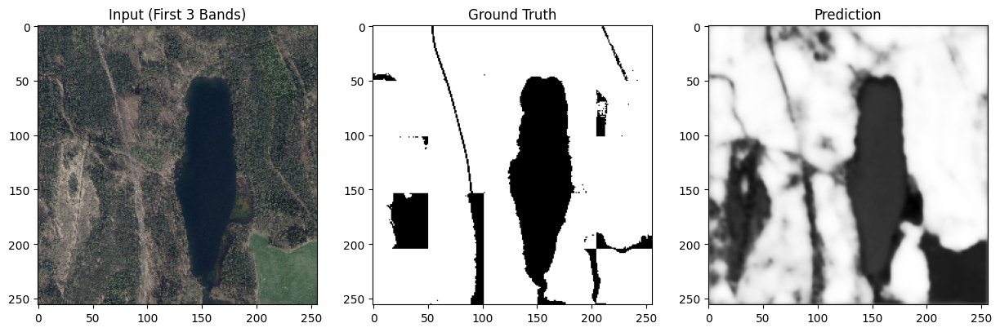

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step

==== Model Evaluation Metrics ====
IoU: 0.7910
Dice: 0.8804
Accuracy: 0.8641
Precision: 0.9229
Recall: 0.8421

Applying Augmentation Configuration 4/4: {'GaussNoise': {'var_limit': (5.0, 25.0), 'p': 0.3}}
Epoch 1/25
8/8 ━━━━━━━━━━━━━━━━━━━━ 39s 3s/step - accuracy: 0.4302 - loss: 0.6955 - val_accuracy: 0.6190 - val_loss: 0.6886
Epoch 2/25
8/8 ━━━━━━━━━━━━━━━━━━━━ 23s 3s/step - accuracy: 0.6095 - loss: 0.6892 - val_accuracy: 0.6190 - val_loss: 0.6854
Epoch 3/25
8/8 ━━━━━━━━━━━━━━━━━━━━ 23s 3s/step - accuracy: 0.6201 - loss: 0.6850 - val_accuracy: 0.6190 - val_loss: 0.6736
Epoch 4/25
8/8 ━━━━━━━━━━━━━━━━━━━━ 23s 3s/step - accuracy: 0.6139 - loss: 0.6719 - val_accuracy: 0.6190 - val_loss: 0.6158
Epoch 5/25
8/8 ━━━━━━━━━━━━━━━━━━━━ 22s 3s/step - accuracy: 0.5433 - loss: 0.6607 - val_accuracy: 0.6190 - val_loss: 0.5179
Epoch 6/25
8/8 ━━━━━━━━━━━━━━━━━━━━ 25s 3s/step - accuracy: 0.5601 - loss: 0.6775 - val_accuracy: 0.6751 - val_loss: 0.5767
Epoch 7/25
8/8

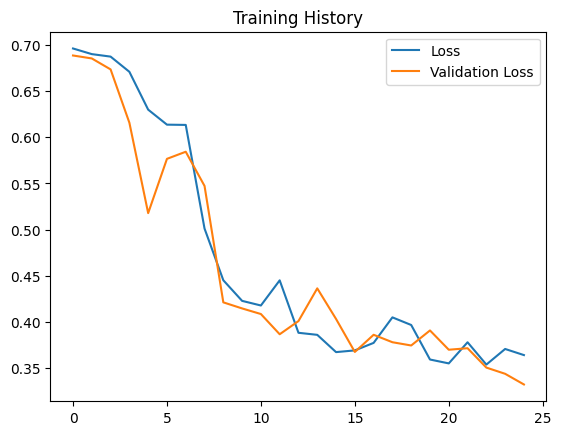

Evaluating model...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


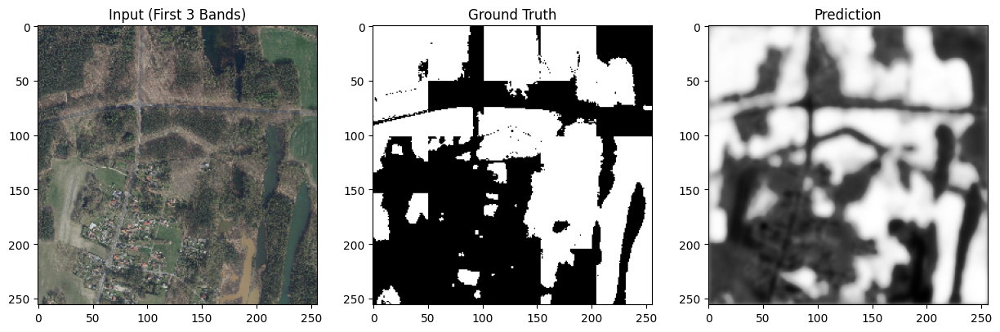

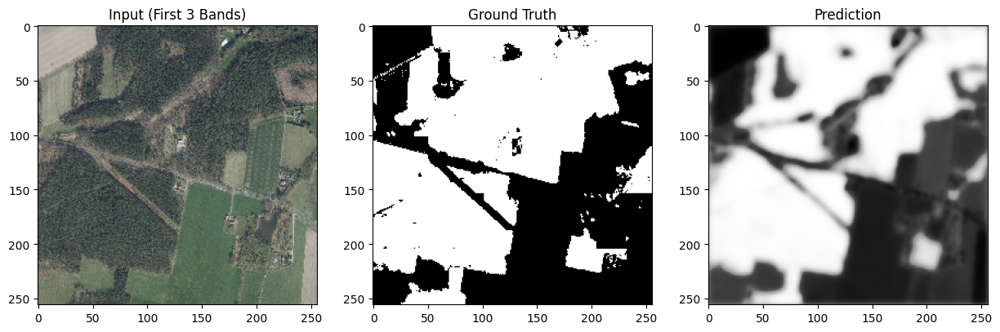

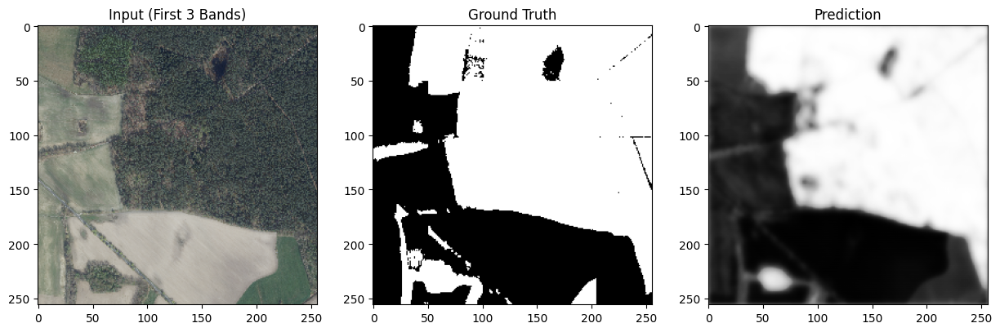

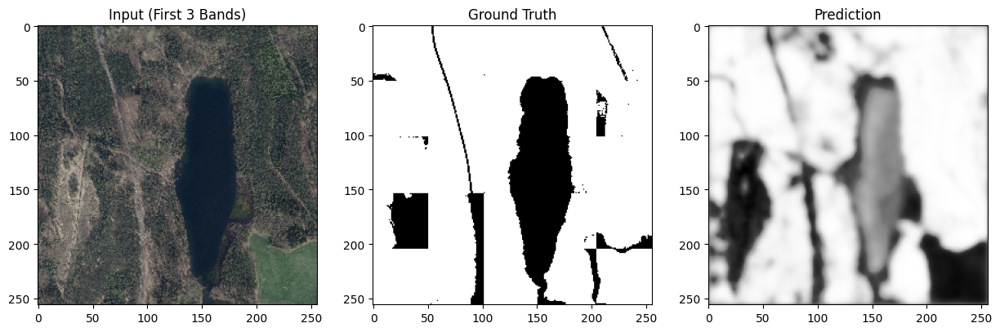

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step

==== Model Evaluation Metrics ====
IoU: 0.7830
Dice: 0.8758
Accuracy: 0.8473
Precision: 0.8797
Recall: 0.8730


In [5]:
from augmentation_pipeline import augment_dataset, plot_original_and_augmented_versions

augment_configs = [
    {"RandomRotate90": 0.5, "HorizontalFlip": 0.5},
    {"ShiftScaleRotate": {"shift_limit": 0.01, "scale_limit": 0.05, "rotate_limit": 15, "p": 0.5}},
    {"RandomBrightnessContrast": {"brightness_limit": 0.1, "contrast_limit": 0.1, "p": 0.5}},
    {"GaussNoise": {"var_limit": (5.0, 25.0), "p": 0.3}},
]
results = {}
for i, config in enumerate(augment_configs):
    print(f"\nApplying Augmentation Configuration {i+1}/{len(augment_configs)}: {config}")
    X_train_aug, Y_train_aug = augment_dataset(X_train, Y_train, config, num_versions=2)
    results[f"Config_{i+1}"] = train_and_evaluate(X_train_aug, Y_train_aug, X_val, Y_val, build_hrnet_with_attention_unet, batch_size=4, epochs=25, learning_rate=1e-3)

# Plot the first 3 images and their augmented versions
#plot_original_and_augmented_versions(X_train[:3], X_train_aug, num_samples=3, num_versions=5)